In [1]:
# Python 3.9. Anaconda recommended.
# -- Prerequisites install 
#%pip install ipykernel --user
#%pip install stable_baselines3 --user
#%pip install tensorboard --user
#%pip install torch --index-url https://download.pytorch.org/whl/cu117 --upgrade --force-reinstall --trusted-host pypi.org --trusted-host pytorch.org --trusted-host download.pytorch.org --no-cache --user


# STABLEBASELINES TESTBED

In [23]:
# Battery env 
import gymnasium as gym
import numpy as np
from typing import Optional, Union
import itertools
import math


import sys
sys.path.append('../../battery-modeling/Step 3. Simulation')

import sys
sys.path.append('../../battery-modeling/Step 3. Simulation')

import SimCellPack as scp



#class BatteryEnv(gym.Env[np.ndarray, Union[int, np.ndarray]]):

class BatteryEnv(gym.Env):

   def __init__(self, numCells, simCycles, sampleFactor, render_mode: Optional[str] = None):
      super().__init__()

      self.env_id = "Battery v0.4"
      self.num_envs = 1

      self.numCells = numCells

      # Define cell model simualtor 
      self.cellModel = scp.SimCellPack(numCells = numCells, simCycles = simCycles, sampleFactor = sampleFactor)
      self.cellModel.startSim()

   
      self.soc_threshold_upper = 0.85
      self.soc_threshold_lower = 0.15


      self.action_space = gym.spaces.Box(-1, 1, (self.numCells,), dtype=np.float32)       # current applied to cell1,cell2,cell3...
      self.observation_space = gym.spaces.Box(0, 1, (self.numCells,), dtype=np.float32)   # SOCs for cell1, cell2, cell3...


      self.episode_time = 0
      self.state = None
      



   def step(self, action):
      err_msg = f"{action!r} ({type(action)}) invalid"
      assert self.action_space.contains(action), err_msg
      assert self.state is not None, "Call reset before using step method."

      # Scale the action space between 0 and 1
      battery_current_values = get_converted_action(action)

      # Send the action as feedback to the cell model
      self.cellModel.sendSimFeedback(battery_current_values)

      # Flags for determining certain occurences
      terminated = False
      truncated = False

      #Apply action to state
      code, self.state = self.cellModel.getSimStep()

      #print("Step: state: " + str(self.state) + " code: " + str(code))

      # Cell simulation finished, terminate
      if code == 0.0:
         truncated = True

      # Compute reward and termination cases
      # Apply step reward. Continue running.
      reward = compute_ballancing_reward(self.state, action, False)

      # Return modified
      return np.array(self.state, dtype=np.float32), float(reward), terminated, truncated, {}

   def reset(self, *, seed: Optional[int] = None, options: Optional[dict] = None,):
   # Reset runs first before starting the simulation to get the initial states
        
      super().reset(seed=seed)

      # Stops and restarts the cell simulation
      self.cellModel.resetSim()


      self.episode_time = 0

      # Get initial states from the cell model
      code, self.state = self.cellModel.getSimStep()

      #print("Reset state: " + str(self.state))

      return np.array(self.state, dtype=np.float32), {}
   

   def __del__(self):
      self.cellModel.stopSim()



#CONVERT ACTION
   
def get_converted_action(action):
   current_values = []
   for current in action:
      shifted_value = ((current + 1.0))/2  #from [-1, 1] to [0, 1], to be reduced from SoC
      current_values.append(shifted_value)

   return current_values


# REWARD CALCULATION HELPERS 

def compute_closeness(socs):
   mean = 0
   for soc in socs:
      mean += soc
   mean = mean/len(socs)

   mean_diff = 0
   for  soc in socs:
      mean_diff += abs(mean - soc)

   mean_diff /= len(socs)

   min = np.array(socs).min()
   max = np.array(socs).max()
   abs_diff_min_max = max - min


   # alternative: (mean_diff), or (mean_diff*05 + abs_diff_min_max*0.5)
   return abs_diff_min_max

# Closeness function debug code
numbers = [0.02, 0.05, 0, 0.01, 0.1]
numbers = [0.8268956, 0.7947008, 0.8274856]
print(compute_closeness(numbers))
print(np.std(numbers, dtype=np.float32))  # standard deviation

# Get reward for a given step
def compute_ballancing_reward(socs, action, should_print):

   # ---- REWARD ALTERNATIVES ----

   # 1. Cost as distance between 2 numbers. Yang
   #reward = -pow(soc0 - soc1, 2)
      
   # 2. Cost as standard deviation
   # reward = -np.std(socs, dtype=np.float32)

   # ---- REWARD ALTERNATIVES ----




   # normalized_socs = []
   # for soc in socs:
   #    newsoc = (soc - min(socs)) / (max(socs) - min(socs))
   #    normalized_socs.append(newsoc)
   
   # SOCs are now between [0, 1]


   reward = 0

   index_min_soc = socs.index(min(socs))

   # reduce reward for any actions on the minimum SOC
   if action[index_min_soc] != 0.0:
      # reward -= 0.01
      reward = -action[index_min_soc]

   # give 0.01 for each SOC that is within 0.01 distance of the smallest SOC.
   non_min_soc_indexes = list(range(len(socs)))
   non_min_soc_indexes.remove(index_min_soc)

   for i in non_min_soc_indexes:
      if (math.isclose(min(socs), socs[i], abs_tol=0.015)):
         reward += 0.01
   
   # Introduce closeness to the reward. Penalty = abs ( maxsoc - minsoc )
   reward = reward - compute_closeness(socs)
             
   return reward


print(compute_ballancing_reward([0.6, 0.61, 0.61], [0.0, 0.5, 0.8], False))



0.03278480000000006
0.0153177325
0.009999999999999992


# PLOTTING FUNCTIONS:

In [2]:
import matplotlib.pyplot as plt
from IPython import display



def moving_average(values, window):
    """
    Smooth values by doing a moving average
    :param values: (numpy array)
    :param window: (int)
    :return: (numpy array)
    """
    weights = np.repeat(1.0, window) / window
    return np.convolve(values, weights, "valid")


def plot_results(log_folder, title="Learning Curve"):
    """
    plot the results

    :param log_folder: (str) the save location of the results to plot
    :param title: (str) the title of the task to plot
    """
    x, y = ts2xy(load_results(log_folder), "timesteps")
    y = moving_average(y, window=1)
    # Truncate x
    x = x[len(x) - len(y) :]

    fig = plt.figure(title)
    plt.plot(x, y)
    plt.xlabel("Number of Timesteps")
    plt.ylabel("Rewards")
    plt.title(title + " Smoothed")
    # plt.show()

    display.clear_output(wait=True)
    display.display(plt.gcf())

# plot_results(log_dir)


In [3]:
import stable_baselines3
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.results_plotter import load_results, ts2xy
from stable_baselines3.common.callbacks import BaseCallback, EvalCallback


import os
import torch
import numpy as np
from typing import Optional, Union




class PlotResultsCallback(BaseCallback):

    def __init__(self, log_dir: str, verbose=1):
        super().__init__(verbose)
        self.log_dir = log_dir
        self.save_path = None

    def _init_callback(self) -> None:
        # Create folder if needed
        if self.save_path is not None:
            os.makedirs(self.save_path, exist_ok=True)

    def _on_step(self) -> bool:
        plot_results(self.log_dir)

        return True
    
    



# Initialize environment

In [4]:
# !pip install gymnasium[box2d]
import gymnasium as gym
from stable_baselines3.common.env_checker import check_env


# Create log dir
log_dir = "./tmp/gym/pponormtest/"
os.makedirs(log_dir, exist_ok=True)


# Create and wrap the environment
env = BatteryEnv(numCells = 3, simCycles = 15, sampleFactor = 10, render_mode = False)

#for i in range(0, 100):
#    check_env(env)


# Logs will be saved in log_dir/monitor.csv 
env = Monitor(env, log_dir) #monitor for raw environments





# Opt1: Initialize a new model

In [5]:
from stable_baselines3 import A2C, SAC, PPO, TD3


print("Is CUDA enabled?", torch.cuda.is_available())



model = PPO('MlpPolicy', env, verbose=1, device="cuda", tensorboard_log="./pponorm_tensorboard_log/")



Is CUDA enabled? True
Using cuda device
Wrapping the env in a DummyVecEnv.


# Opt 2: Load existing trained model from save file

In [11]:
from stable_baselines3 import A2C, SAC, PPO, TD3

model = PPO.load(env=env, path=os.path.join(log_dir, "best_model_ppo_batterysim3000"))

Wrapping the env in a DummyVecEnv.


Train model for X timesteps.
Can be interrupted and retain training.

In [6]:
callback = EvalCallback(env, log_path=log_dir, n_eval_episodes= 1, eval_freq= 50000,
                            best_model_save_path=os.path.join(log_dir, "best_model_ppo_norm"))

In [8]:
from stable_baselines3.common import results_plotter
from stable_baselines3 import A2C, SAC, PPO, TD3


# callback = EvalCallback(env, log_path=log_dir, n_eval_episodes= 1, eval_freq= 15000,
#                             best_model_save_path=os.path.join(log_dir, "best_model_ppo_norm"),
#                             callback_on_new_best=PlotResultsCallback(log_dir=log_dir))

# callback = EvalCallback(env, log_path=log_dir, n_eval_episodes= 1, eval_freq= 15000,
#                             best_model_save_path=os.path.join(log_dir, "best_model_ppo_norm"))

# Eval callback, for plotting and seeing how the training is going, and saving best models. No effect on the results.

# model.learn(total_timesteps=int(10000000), callback=callback)

for i in range (0, 8):
    model.learn(total_timesteps=int(100000), callback=callback)



# Plot helper from the library
results_plotter.plot_results(
    [log_dir], 1e7, results_plotter.X_TIMESTEPS, "PPO - Env: Battery"
)

# only ballance during resting
# during resting SOC is more accurate in estimation
# its also dangerous to do it during working times

# use larger SOC cells more AND use smallest SOC less4


# with Power Electronics, the output voltage has been changed.

# do ballancing while it rests'



# !!!!!!!!!! You should know that PPO1 and TRPO update self.num_timesteps after each rollout (and not each step) because they rely on MPI.

Logging to ./pponorm_tensorboard_log/PPO_3
-----------------------------
| time/              |      |
|    fps             | 388  |
|    iterations      | 1    |
|    time_elapsed    | 5    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 340          |
|    iterations           | 2            |
|    time_elapsed         | 12           |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0049823173 |
|    clip_fraction        | 0.0781       |
|    clip_range           | 0.2          |
|    entropy_loss         | -2.1         |
|    explained_variance   | 0.0103       |
|    learning_rate        | 0.0003       |
|    loss                 | 0.0127       |
|    n_updates            | 500          |
|    policy_gradient_loss | -0.0041      |
|    std                  | 0.487        |
|    value_loss 

KeyboardInterrupt: 

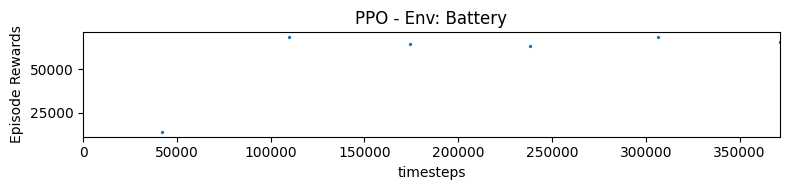

In [9]:

results_plotter.plot_results(
    [log_dir], 1e7, results_plotter.X_TIMESTEPS, "PPO - Env: Battery"
)

In [9]:

plot_results(log_dir)

ValueError: v cannot be empty

# Test 1 episode of the model

In [1]:
model.save(os.path.join(log_dir, "best_model_ppo_batterysim_9000"))

NameError: name 'model' is not defined

[[0.8499998 0.8499998 0.8499998]]  ACTION:[0. 0. 0.]  >>>> 
[[0.8499842  0.84998435 0.84998435]]  REWARD:  [1.0199999]   
[[0.8499842  0.84998435 0.84998435]]  ACTION:[0. 0. 0.]  >>>> 
[[0.84939086 0.84939784 0.8493999 ]]  REWARD:  [1.0199909]   
[[0.84939086 0.84939784 0.8493999 ]]  ACTION:[0. 0. 0.]  >>>> 
[[0.84932995 0.8493376  0.8493398 ]]  REWARD:  [1.0199902]   
[[0.84932995 0.8493376  0.8493398 ]]  ACTION:[0. 0. 0.]  >>>> 
[[0.8498221  0.84982383 0.84982413]]  REWARD:  [1.019998]   
[[0.8498221  0.84982383 0.84982413]]  ACTION:[0. 0. 0.]  >>>> 
[[0.8497901 0.8497922 0.8497925]]  REWARD:  [1.0199976]   
[[0.8497901 0.8497922 0.8497925]]  ACTION:[0. 0. 0.]  >>>> 
[[0.84901476 0.84902585 0.8490289 ]]  REWARD:  [1.0199859]   
[[0.84901476 0.84902585 0.8490289 ]]  ACTION:[0. 0. 0.]  >>>> 
[[0.84855133 0.8485678  0.8485725 ]]  REWARD:  [1.0199789]   
[[0.84855133 0.8485678  0.8485725 ]]  ACTION:[0. 0. 0.]  >>>> 
[[0.8485767  0.84859276 0.8485973 ]]  REWARD:  [1.0199795]   
[[0.848576

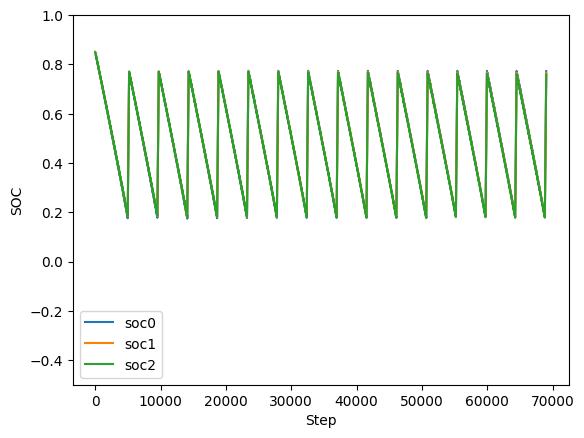

In [11]:
from stable_baselines3 import A2C, SAC, PPO, TD3
import os

# model.save(os.path.join(log_dir, "best_model_ppo_batterysimm"))

# eval_env = BatteryEnv(numCells = 3, simCycles = 2, sampleFactor = 10, render_mode = False)
# model = PPO.load(env=eval_env, path=os.path.join(log_dir, "best_model_ppo_batterysim"))

def test_trained_model():
    obs = model.get_env().reset()
    episode_reward = 0

    obsArray = []

    while True:
        obsArray.append(obs)
        action, _states = model.predict(obs)
        # oldObs = obs
        obs, rewards, done, info = model.get_env().step(action)
        episode_reward += rewards.squeeze()

        if not done:
            print(str(obs) + "  ACTION:" + str(get_converted_action(action)[0]) + "  >>>> ")
            print("  REWARD:  "  + str(rewards) + "   ")
        else:
            info_item = info.pop()
            print("FINAL: ")
            print(str(info_item.get('terminal_observation'))  + "       ACTION:" )
            print(str(str(get_converted_action(action.flatten()))))
            print("REWARD:  " + str(rewards[0]))
            print("EPISODE TOTAL REWARD: " + str(episode_reward))

            # plot final model
            fig = plt.figure(1)

            data_np = np.array(obsArray)

            plt.xlabel('Step')
            plt.ylabel('SOC')
            print("------------------------------------------------------")
            plt.ylim([-0.5, 1])


            i = 0
            for soc in data_np.T:
                plt.plot(np.arange(start=0, stop=len(data_np), step=1), soc.flatten(), label="soc"+str(i))
                i += 1

            plt.legend()
            #plt.pause(3)

            # obsArray = []
            # episode_reward = 0
            obs = model.get_env().reset()

            #time.sleep(0.5)
            break


# Add SOC Difference christmas tree to this plot

test_trained_model()


### Sanity check. See if running the simulation with no action from the model gives us similar results

[[0.8498895 0.8498891 0.8498889]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01999943]   
[[0.8492098  0.84920835 0.8492055 ]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01999569]   
[[0.84905475 0.8490527  0.8490496 ]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01999485]   
[[0.84944457 0.84944195 0.8494416 ]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01999702]   
[[0.8493181  0.84931505 0.84931445]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01999636]   
[[0.84845895 0.8484547  0.8484506 ]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01999162]   
[[0.8479073 0.8479022 0.8478959]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01998859]   
[[0.8478373 0.8478318 0.8478256]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01998824]   
[[0.84711033 0.8471037  0.84709454]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01998423]   
[[0.8467825  0.84677494 0.8467649 ]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01998243]   
[[0.84715086 0.8471427  0.84713537]]  ACTION:[0. 0. 0.]  >>>> 
  REWARD:  [0.01998448]   
[[0.8476185 0.84760

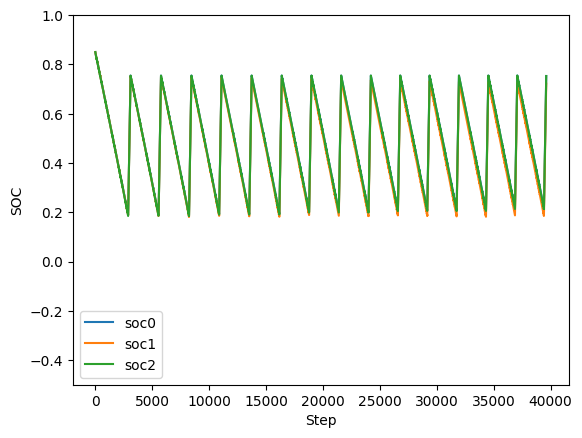

In [18]:
def test_trained_model_no_action():
    obs = model.get_env().reset()
    episode_reward = 0

    obsArray = []

    while True:
        obsArray.append(obs)
        action, _states = model.predict(obs)
        # oldObs = obs
        obs, rewards, done, info = model.get_env().step([[0., 0., 0.]])
        episode_reward += rewards.squeeze()

        if not done:
            print(str(obs) + "  ACTION:" + str(get_converted_action(action)[0]) + "  >>>> ")
            print("  REWARD:  "  + str(rewards) + "   ")
        else:
            info_item = info.pop()
            print("FINAL: ")
            print(str(info_item.get('terminal_observation'))  + "       ACTION:" )
            print(str(str(get_converted_action(action.flatten()))))
            print("REWARD:  " + str(rewards[0]))
            print("EPISODE TOTAL REWARD: " + str(episode_reward))

            # plot final model
            fig = plt.figure(1)

            data_np = np.array(obsArray)

            plt.xlabel('Step')
            plt.ylabel('SOC')
            print("------------------------------------------------------")
            plt.ylim([-0.5, 1])


            i = 0
            for soc in data_np.T:
                plt.plot(np.arange(start=0, stop=len(data_np), step=1), soc.flatten(), label="soc"+str(i))
                i += 1

            plt.legend()
            #plt.pause(3)

            # obsArray = []
            # episode_reward = 0
            obs = model.get_env().reset()

            #time.sleep(0.5)
            break




test_trained_model_no_action()